Author - Mihir Ahuja

Data Citation - https://www.kaggle.com/c/nlp-getting-started

Other Citation - Followed Steps by ratan123 ( Ratan's notebook is a great starting guide for this dataset)
 Citaion For  https://www.kaggle.com/ratan123/start-from-here-disaster-tweets-eda-basic-model (Snippets used)

In [9]:
import pandas as pd
import numpy as np
import re
import plotly.express as px
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
stopwords = set(STOPWORDS)
import collections
import nltk
from nltk.tokenize import sent_tokenize,word_tokenize
import matplotlib.pyplot as plt 
import seaborn as sns 
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [43]:
train = pd.read_csv('/content/drive/My Drive/TweetPrediction/train_v2.csv')
test = pd.read_csv('/content/drive/My Drive/TweetPrediction/test_v2.csv')
train['text'] = train['text'].astype(str)
test['text'] = test['text'].astype(str)

def cleanhtml(raw_html):
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, '', raw_html)
    return cleantext

def removeurl(raw_text):
    clean_text = re.sub(r'^https?:\/\/.*[\r\n]*', '', raw_text, flags=re.MULTILINE)
    return clean_text


train['text'] = train['text'].apply(lambda x: cleanhtml(x))
test['text'] = test['text'].apply(lambda x: cleanhtml(x))

train['text'] = train['text'].apply(lambda x:removeurl(x))
test['text'] = test['text'].apply(lambda x: removeurl(x))


In [5]:
train

,Unnamed: 0,id,keyword,location,text,target,Number_of_words,Number_of_Sentences,Number_of_Unique_Words,Number_of_Stop_Words
0,0,1,NaN,NaN,Our Deeds are the Reason of this #earthquake M...,1,14,1,13,5
1,1,4,NaN,NaN,Forest fire near La Ronge Sask. Canada,1,8,2,7,0
2,2,5,NaN,NaN,All residents asked to 'shelter in place' are ...,1,24,2,20,9
3,3,6,NaN,NaN,"13,000 people receive #wildfires evacuation or...",1,9,1,8,1
4,4,7,NaN,NaN,Just got sent this photo from Ruby #Alaska as ...,1,18,1,15,6
...,...,...,...,...,...,...,...,...,...,...
7608,7608,10869,NaN,NaN,Two giant cranes holding a bridge collapse int...,1,13,1,11,3
7609,7609,10870,NaN,NaN,@aria_ahrary @TheTawniest The out of control w...,1,24,2,17,7
7610,7610,10871,NaN,NaN,M1.94 [01:04 UTC]?5km S of Volcano Hawaii. htt...,1,15,2,8,2
7611,7611,10872,NaN,NaN,Police investigating after an e-bike collided ...,1,21,2,19,5


Histograms for features

In [8]:
fig = px.histogram(train, x="Number_of_words", color="target", marginal="rug", # can be `box`, `violin`
                         hover_data=train.columns)
fig.show()


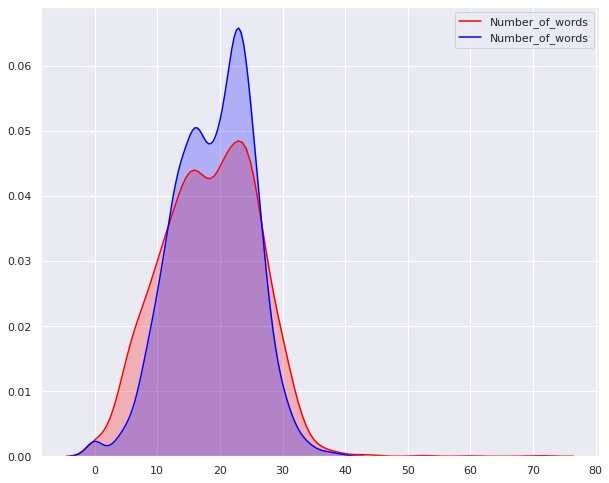

In [33]:
sns.set()
sns.set(rc={'figure.figsize':(10,8.27)})

sns.kdeplot(train[train['target']==0].Number_of_words, color="red",shade=True) 
sns.kdeplot(train[train['target']==1].Number_of_words, color="blue",shade=True ) 

plt.show()


In [26]:
fig = px.histogram(train, x="Number_of_Sentences", color="target", marginal="rug", # can be `box`, `violin`
                         hover_data=train.columns)
fig.show()


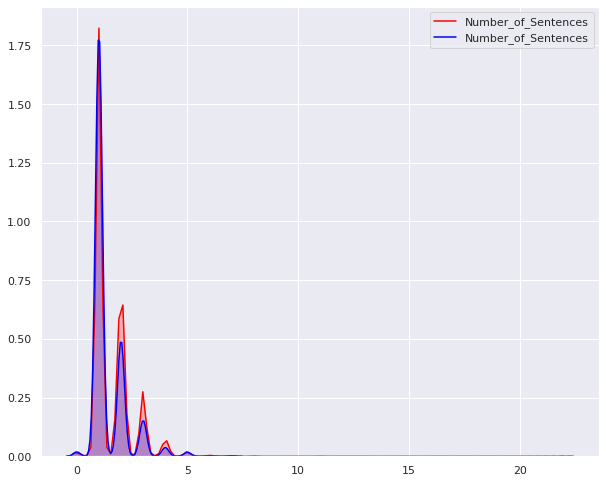

In [34]:
sns.set()
sns.set(rc={'figure.figsize':(10,8.27)})

sns.kdeplot(train[train['target']==0].Number_of_Sentences, color="red",shade=True) 
sns.kdeplot(train[train['target']==1].Number_of_Sentences, color="blue",shade=True ) 

plt.show()


In [28]:
fig = px.histogram(train, x="Number_of_Unique_Words", color="target", marginal="rug", # can be `box`, `violin`
                         hover_data=train.columns)
fig.show()


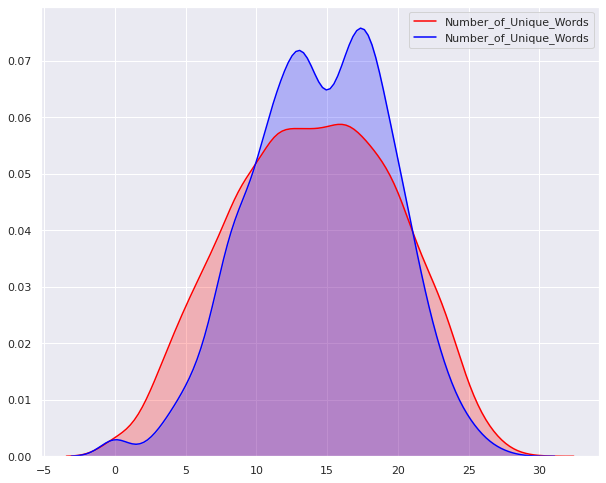

In [35]:
sns.set()
sns.set(rc={'figure.figsize':(10,8.27)})

sns.kdeplot(train[train['target']==0].Number_of_Unique_Words, color="red",shade=True) 
sns.kdeplot(train[train['target']==1].Number_of_Unique_Words, color="blue",shade=True ) 

plt.show()


In [31]:
fig = px.histogram(train, x="Number_of_Stop_Words", color="target", marginal="rug", # can be `box`, `violin`
                         hover_data=train.columns)
fig.show()


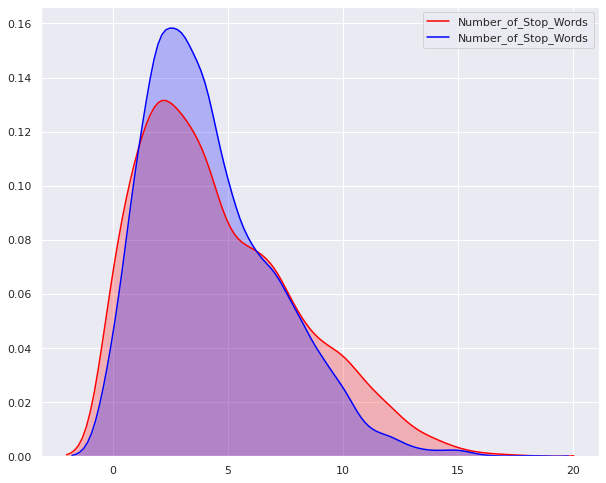

In [36]:
sns.set()
sns.set(rc={'figure.figsize':(10,8.27)})

sns.kdeplot(train[train['target']==0].Number_of_Stop_Words, color="red",shade=True) 
sns.kdeplot(train[train['target']==1].Number_of_Stop_Words, color="blue",shade=True ) 

plt.show()


Feature for number of Hashtags and Mentions

In [37]:
def Number_of_Hashtage(tweet):
  return tweet.count('#')

In [44]:
train['Number_of_Hashtage'] = train['text'].apply(lambda x: Number_of_Hashtage(x))
test['Number_of_Hashtage'] = test['text'].apply(lambda x: Number_of_Hashtage(x))


In [46]:
def Number_of_Mentions(tweet):
  return tweet.count('@')

In [47]:
train['Number_of_Mentions'] = train['text'].apply(lambda x: Number_of_Mentions(x))
test['Number_of_Mentions'] = test['text'].apply(lambda x: Number_of_Mentions(x))


In [49]:
fig = px.histogram(train, x="Number_of_Hashtage", color="target", marginal="rug", # can be `box`, `violin`
                         hover_data=train.columns)
fig.show()


In [50]:
fig = px.histogram(train, x="Number_of_Mentions", color="target", marginal="rug", # can be `box`, `violin`
                         hover_data=train.columns)
fig.show()


Average Word Length

In [52]:
def Average_Word_Length(tweet):
  
  words = tweet.split()
  average = sum(len(word) for word in words) / len(words)
  return average

In [55]:
train['Average_Word_Length'] = train['text'].apply(lambda x: Average_Word_Length(x))
test['Average_Word_Length'] = test['text'].apply(lambda x: Average_Word_Length(x))


In [56]:
fig = px.histogram(train, x="Average_Word_Length", color="target", marginal="rug", # can be `box`, `violin`
                         hover_data=train.columns)
fig.show()


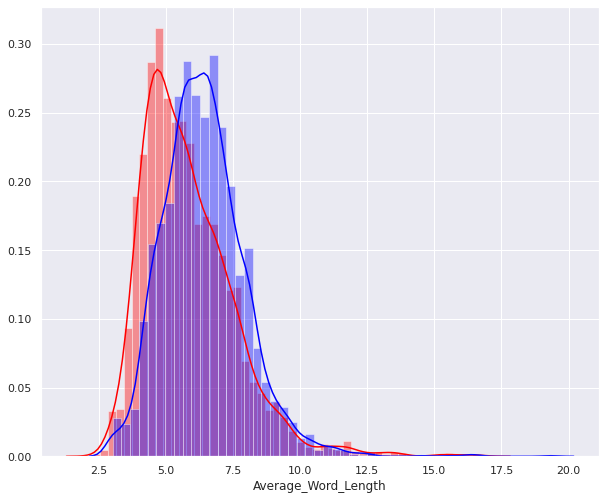

In [62]:
sns.set()
sns.set(rc={'figure.figsize':(10,8.27)})

sns.distplot(train[train['target']==0].Average_Word_Length, color="red") 
sns.distplot(train[train['target']==1].Average_Word_Length, color="blue") 

plt.show()
